# US Company Bankruptcy

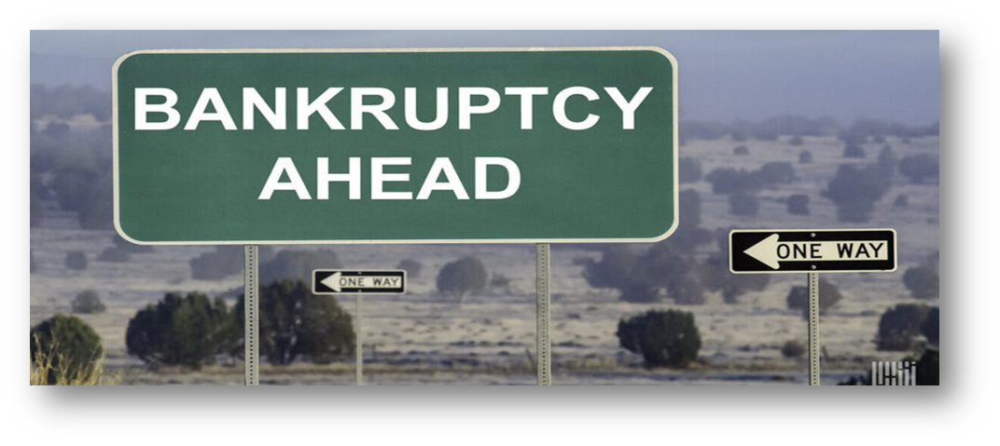

# Target: 
### The purpose of this dataset is to build a model which can predict future bankruptcy event    of companies.  Utilizes data of NYSE and NASDAQ Companies (1999-2018), which contains  various financial key figures of the selected companies.


In [3]:
# Import necessary libraries
import pandas as pd               # For data manipulation
import plotly_express as px       # For interactive data visualization
import numpy as np                # For numerical operations
import warnings                   # To suppress warnings
import seaborn as sns             # For statistical data visualization
import matplotlib.pyplot as plt   # For static data visualization
import joblib                     # For saving and loading machine learning models

# Suppress warnings to avoid cluttering the output
warnings.filterwarnings('ignore')



In [4]:
# Read the 'american_bankruptcy.csv' file into a pandas DataFrame and store it in the variable 'df'
df = pd.read_csv('american_bankruptcy.csv')

# Display the DataFrame to view its contents
df

,company_name,status_label,year,X1,X2,X3,X4,X5,X6,X7,...,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18
0,C_1,alive,1999,511.267,833.107,18.373,89.031,336.018,35.163,128.348,...,1024.333,740.998,180.447,70.658,191.226,163.816,201.026,1024.333,401.483,935.302
1,C_1,alive,2000,485.856,713.811,18.577,64.367,320.590,18.531,115.187,...,874.255,701.854,179.987,45.790,160.444,125.392,204.065,874.255,361.642,809.888
2,C_1,alive,2001,436.656,526.477,22.496,27.207,286.588,-58.939,77.528,...,638.721,710.199,217.699,4.711,112.244,150.464,139.603,638.721,399.964,611.514
3,C_1,alive,2002,396.412,496.747,27.172,30.745,259.954,-12.410,66.322,...,606.337,686.621,164.658,3.573,109.590,203.575,124.106,606.337,391.633,575.592
4,C_1,alive,2003,432.204,523.302,26.680,47.491,247.245,3.504,104.661,...,651.958,709.292,248.666,20.811,128.656,131.261,131.884,651.958,407.608,604.467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78677,C_8971,alive,2014,233.211,43.338,14.094,45.615,3.376,25.261,22.846,...,104.223,1099.101,184.666,31.521,60.885,28.197,28.095,104.223,225.887,58.608
78678,C_8971,alive,2015,105.559,59.184,42.592,202.133,2.288,129.688,54.611,...,291.153,1865.926,770.103,159.541,231.969,88.128,157.783,291.153,880.327,89.020
78679,C_8971,alive,2016,63.971,69.074,65.057,79.051,2.581,-1.442,42.467,...,169.858,1746.235,683.985,13.994,100.784,85.765,156.341,169.858,770.233,90.807
78680,C_8971,alive,2017,135.207,66.527,65.330,69.171,2.013,-20.401,27.217,...,161.884,1736.110,694.035,3.841,95.357,82.010,135.941,161.884,776.697,92.713


In [5]:
# Rename columns in the DataFrame 'df' to provide more descriptive names.
df.rename(columns={
    'X1': 'Current_Assets',
    'X2': 'Cost_of_Goods_Sold',
    'X3': 'Depreciation_and_Amortization',
    'X4': 'EBITDA',
    'X5': 'Inventory',
    'X6': 'Net_Income',
    'X7': 'Total_Receivables',
    'X8': 'Market_Value',
    'X9': 'Net_Sales',
    'X10': 'Total_Assets',
    'X11': 'Total_Long_term_Debt',
    'X12': 'EBIT',
    'X13': 'Gross_Profit',
    'X14': 'Total_Current_Liabilities',
    'X15': 'Retained_Earnings',
    'X16': 'Total_Revenue',
    'X17': 'Total_Liabilities',
    'X18': 'Total_Operating_Expenses'
}, inplace=True)


In [6]:
df

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
0,C_1,alive,1999,511.267,833.107,18.373,89.031,336.018,35.163,128.348,...,1024.333,740.998,180.447,70.658,191.226,163.816,201.026,1024.333,401.483,935.302
1,C_1,alive,2000,485.856,713.811,18.577,64.367,320.590,18.531,115.187,...,874.255,701.854,179.987,45.790,160.444,125.392,204.065,874.255,361.642,809.888
2,C_1,alive,2001,436.656,526.477,22.496,27.207,286.588,-58.939,77.528,...,638.721,710.199,217.699,4.711,112.244,150.464,139.603,638.721,399.964,611.514
3,C_1,alive,2002,396.412,496.747,27.172,30.745,259.954,-12.410,66.322,...,606.337,686.621,164.658,3.573,109.590,203.575,124.106,606.337,391.633,575.592
4,C_1,alive,2003,432.204,523.302,26.680,47.491,247.245,3.504,104.661,...,651.958,709.292,248.666,20.811,128.656,131.261,131.884,651.958,407.608,604.467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78677,C_8971,alive,2014,233.211,43.338,14.094,45.615,3.376,25.261,22.846,...,104.223,1099.101,184.666,31.521,60.885,28.197,28.095,104.223,225.887,58.608
78678,C_8971,alive,2015,105.559,59.184,42.592,202.133,2.288,129.688,54.611,...,291.153,1865.926,770.103,159.541,231.969,88.128,157.783,291.153,880.327,89.020
78679,C_8971,alive,2016,63.971,69.074,65.057,79.051,2.581,-1.442,42.467,...,169.858,1746.235,683.985,13.994,100.784,85.765,156.341,169.858,770.233,90.807
78680,C_8971,alive,2017,135.207,66.527,65.330,69.171,2.013,-20.401,27.217,...,161.884,1736.110,694.035,3.841,95.357,82.010,135.941,161.884,776.697,92.713


In [7]:
# This function is designed to address the issue of wide data with 43 columns, where it becomes difficult
# to view all the values properly. By creating this function, we aim to display all values of all columns,
# making the data analysis process more convenient and accessible.

def show_df(x):
    
    """
    Display specific columns from the DataFrame 'df' to showcase a subset of data.

    Args:
        df (pandas.DataFrame): The input DataFrame.

    Returns:
        None
    """
    
    # Create separate DataFrames with selected columns for display
    df1 = x[['company_name', 'status_label', 'year', 'Current_Assets',
       'Cost_of_Goods_Sold', 'Depreciation_and_Amortization', 'EBITDA']].head(3)
    df2 = x[['Inventory', 'Net_Income', 'Total_Receivables', 'Market_Value',
       'Net_Sales', 'Total_Assets', 'Total_Long_term_Debt', 'EBIT',]].head(3)
    df3 = x[['Gross_Profit', 'Total_Current_Liabilities', 'Retained_Earnings',]].head(3)
    df4 = x[['Total_Revenue', 'Total_Liabilities', 'Total_Operating_Expenses']].head(3)
    
    
    # Display the separate DataFrames
    display(df1)
    display(df2)
    display(df3)
    display(df4)
    
    
# Show DataFrame 'df'
show_df(df)

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA
0,C_1,alive,1999,511.267,833.107,18.373,89.031
1,C_1,alive,2000,485.856,713.811,18.577,64.367
2,C_1,alive,2001,436.656,526.477,22.496,27.207


,Inventory,Net_Income,Total_Receivables,Market_Value,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT
0,336.018,35.163,128.348,372.7519,1024.333,740.998,180.447,70.658
1,320.590,18.531,115.187,377.1180,874.255,701.854,179.987,45.790
2,286.588,-58.939,77.528,364.5928,638.721,710.199,217.699,4.711


,Gross_Profit,Total_Current_Liabilities,Retained_Earnings
0,191.226,163.816,201.026
1,160.444,125.392,204.065
2,112.244,150.464,139.603


,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
0,1024.333,401.483,935.302
1,874.255,361.642,809.888
2,638.721,399.964,611.514


In [8]:
# This function 'summary' takes a DataFrame 'df' as input and generates a summary report for the data.
# It calculates and displays information such as the shape of the DataFrame, data types, missing values,
# unique values, basic descriptive statistics (min, max, mean), and the first three values of the dataset.
# The summary is returned as a DataFrame.

def summary(df):
    # Display the shape of the DataFrame
    print(f'data shape: {df.shape}')

    # Create a summary DataFrame with data types
    summ = pd.DataFrame(df.dtypes, columns=['data type'])

    # Calculate and add the number of missing values
    summ['#missing'] = df.isnull().sum().values

    # Calculate and add the percentage of missing values
    summ['%missing'] = df.isnull().sum().values / len(df) * 100

    # Calculate and add the number of unique values
    summ['#unique'] = df.nunique().values

    # Create a DataFrame with basic descriptive statistics
    desc = pd.DataFrame(df.describe(include='all').transpose())

    # Add minimum, maximum, mean, and the first three values to the summary DataFrame
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['mean'] = desc['mean'].values
    summ['first value'] = df.loc[0].values
    summ['second value'] = df.loc[1].values
    summ['third value'] = df.loc[2].values

    # Return the summary DataFrame
    return summ

# To use this function and generate a summary of your DataFrame 'df', you can call it like this:
summary(df)


data shape: (78682, 21)


,data type,#missing,%missing,#unique,min,max,mean,first value,second value,third value
company_name,object,0,0.0,8971,NaN,NaN,NaN,C_1,C_1,C_1
status_label,object,0,0.0,2,NaN,NaN,NaN,alive,alive,alive
year,int64,0,0.0,20,1999.0,2018.0,2007.506317,1999,2000,2001
Current_Assets,float64,0,0.0,65895,-7.76,169662.0,880.362485,511.267,485.856,436.656
Cost_of_Goods_Sold,float64,0,0.0,65690,-366.645,374623.0,1594.529029,833.107,713.811,526.477
Depreciation_and_Amortization,float64,0,0.0,36010,0.0,28430.0,121.234256,18.373,18.577,22.496
EBITDA,float64,0,0.0,59060,-21913.0,81730.0,376.759424,89.031,64.367,27.207
Inventory,float64,0,0.0,38898,0.0,62567.0,201.605717,336.018,320.59,286.588
Net_Income,float64,0,0.0,55550,-98696.0,104821.0,129.382453,35.163,18.531,-58.939
Total_Receivables,float64,0,0.0,49577,-0.006,65812.0,286.832743,128.348,115.187,77.528


# Columns Handling

## company_name

In [9]:
# Extracts unique values from the 'company_name' column in the DataFrame and converts them to a list.
df['company_name'].unique().tolist()

['C_1',
 'C_2',
 'C_3',
 'C_4',
 'C_5',
 'C_6',
 'C_7',
 'C_8',
 'C_9',
 'C_10',
 'C_11',
 'C_12',
 'C_13',
 'C_14',
 'C_15',
 'C_16',
 'C_17',
 'C_18',
 'C_19',
 'C_20',
 'C_21',
 'C_22',
 'C_23',
 'C_24',
 'C_25',
 'C_26',
 'C_27',
 'C_28',
 'C_29',
 'C_30',
 'C_31',
 'C_32',
 'C_33',
 'C_34',
 'C_35',
 'C_36',
 'C_37',
 'C_38',
 'C_39',
 'C_40',
 'C_41',
 'C_42',
 'C_43',
 'C_44',
 'C_45',
 'C_46',
 'C_47',
 'C_48',
 'C_49',
 'C_50',
 'C_51',
 'C_52',
 'C_53',
 'C_54',
 'C_55',
 'C_56',
 'C_57',
 'C_58',
 'C_59',
 'C_60',
 'C_61',
 'C_62',
 'C_63',
 'C_64',
 'C_65',
 'C_66',
 'C_67',
 'C_68',
 'C_69',
 'C_70',
 'C_71',
 'C_72',
 'C_73',
 'C_74',
 'C_75',
 'C_76',
 'C_77',
 'C_78',
 'C_79',
 'C_80',
 'C_81',
 'C_82',
 'C_83',
 'C_84',
 'C_85',
 'C_86',
 'C_87',
 'C_88',
 'C_89',
 'C_90',
 'C_91',
 'C_92',
 'C_93',
 'C_94',
 'C_95',
 'C_96',
 'C_97',
 'C_98',
 'C_99',
 'C_100',
 'C_101',
 'C_102',
 'C_103',
 'C_104',
 'C_105',
 'C_106',
 'C_107',
 'C_108',
 'C_109',
 'C_110',
 'C_111'

In [10]:
# Create a line plot using Plotly Express to visualize the relationship between 'company_name' and 'Total_Assets'.
px.line(data_frame=df , x='company_name' , y='Total_Assets')

# status_label

In [11]:
# Count the occurrences of each unique value in the 'status_label' column and display the counts
df['status_label'].value_counts()

status_label
alive     73462
failed     5220
Name: count, dtype: int64

In [12]:
# Create a histogram plot using Plotly Express to visualize the distribution of 'status_label' values.
# The 'x' parameter specifies the column to be plotted, and 'text_auto=True' displays hover text.
px.histogram(data_frame=df , x='status_label',text_auto=True)

In [13]:
# Create a histogram using Plotly Express to visualize the distribution of 'EBITDA' values
# while color-coding the bars by 'status_label'.
px.histogram(data_frame=df  ,x='EBITDA' , color='status_label' )

# Year

In [14]:
# Retrieve the unique values present in the 'year' column of the DataFrame.
df['year'].unique()

array([1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018], dtype=int64)

## Current_Assets

In [15]:
# Generate descriptive statistics for the 'Current_Assets' column in the DataFrame.
df['Current_Assets'].describe()

count     78682.000000
mean        880.362485
std        3928.564794
min          -7.760000
25%          18.924000
50%         100.449500
75%         431.526750
max      169662.000000
Name: Current_Assets, dtype: float64

<Axes: xlabel='Current_Assets'>

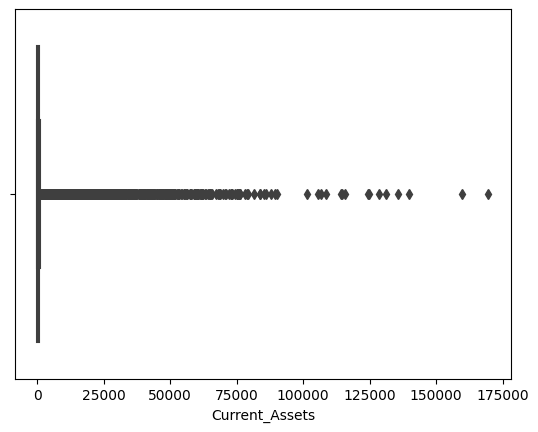

In [16]:
# Create a boxplot to visualize the distribution of 'Current_Assets' in the DataFrame.
sns.boxplot(x='Current_Assets', data=df)

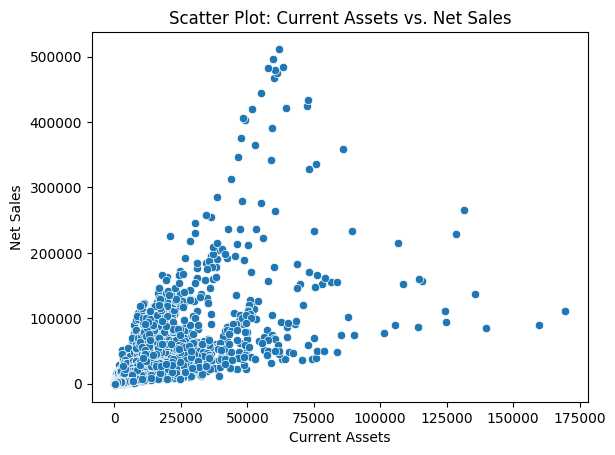

In [17]:
# Create a scatter plot to visualize the relationship between 'Current_Assets' and 'Net_Sales'.
sns.scatterplot(data=df, x='Current_Assets', y='Net_Sales')

# Add labels to the x and y axes.
plt.xlabel('Current Assets')
plt.ylabel('Net Sales')

# Set the title for the scatter plot.
plt.title('Scatter Plot: Current Assets vs. Net Sales')

# Display the plot.
plt.show()

## Cost_of_Goods_Sold

In [18]:
# Generate descriptive statistics for the 'Cost_of_Goods_Sold' column in the DataFrame.
df['Cost_of_Goods_Sold'].describe()

count     78682.000000
mean       1594.529029
std        8930.484664
min        -366.645000
25%          17.038250
50%         103.661000
75%         634.548000
max      374623.000000
Name: Cost_of_Goods_Sold, dtype: float64

<Axes: xlabel='Cost_of_Goods_Sold'>

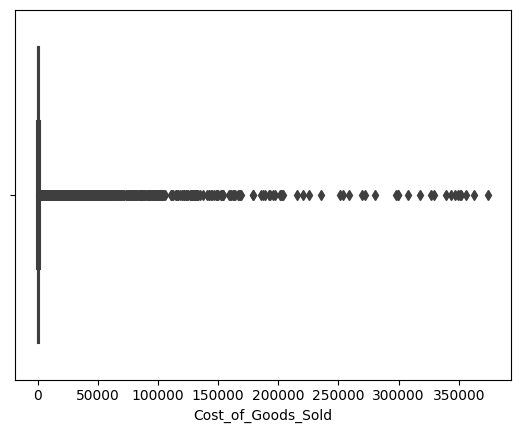

In [19]:
# Create a boxplot to visualize the distribution of 'Cost_of_Goods_Sold' in the DataFrame.
sns.boxplot(x='Cost_of_Goods_Sold', data=df)

## Depreciation_and_Amortization

In [20]:
# Generate descriptive statistics for the 'Depreciation_and_Amortization' column in the DataFrame.
df['Depreciation_and_Amortization'].describe()

count    78682.000000
mean       121.234256
std        652.376804
min          0.000000
25%          1.192000
50%          7.929500
75%         47.971750
max      28430.000000
Name: Depreciation_and_Amortization, dtype: float64

<Axes: xlabel='Depreciation_and_Amortization'>

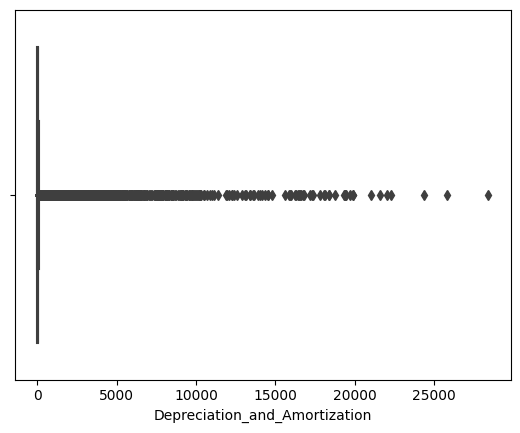

In [21]:
# Create a boxplot to visualize the distribution of 'Depreciation_and_Amortization' in the DataFrame.
sns.boxplot(data=df , x='Depreciation_and_Amortization')

## EBITDA ----->"Earnings before interest, taxes, depreciation, and amortization"

In [22]:
# Generate descriptive statistics for the 'EBITDA' column in the DataFrame.
df['EBITDA'].describe()

count    78682.000000
mean       376.759424
std       2012.023142
min     -21913.000000
25%         -0.811000
50%         15.034500
75%        139.655250
max      81730.000000
Name: EBITDA, dtype: float64

In [23]:
# Select rows in the DataFrame where 'EBITDA' is equal to the minimum 'EBITDA' value.
df[df['EBITDA'] == df['EBITDA'].min()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
1187,C_98,alive,2015,3752.0,27919.0,4000.0,-21913.0,570.0,-23119.0,1253.0,...,6383.0,18842.0,8777.0,-25913.0,-21536.0,1841.0,-7269.0,6383.0,14614.0,28296.0


<Axes: xlabel='EBITDA'>

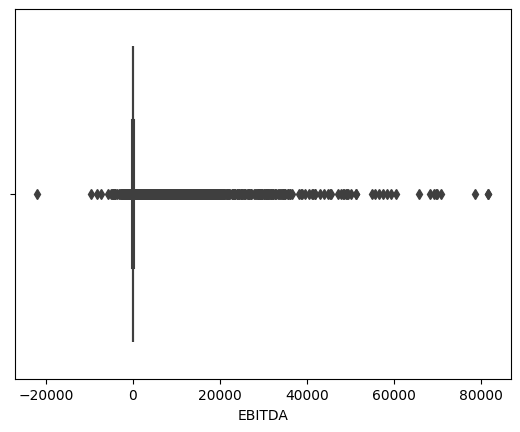

In [24]:
# Create a boxplot to visualize the distribution of 'EBITDA' values in the DataFrame.
sns.boxplot(data=df , x='EBITDA')

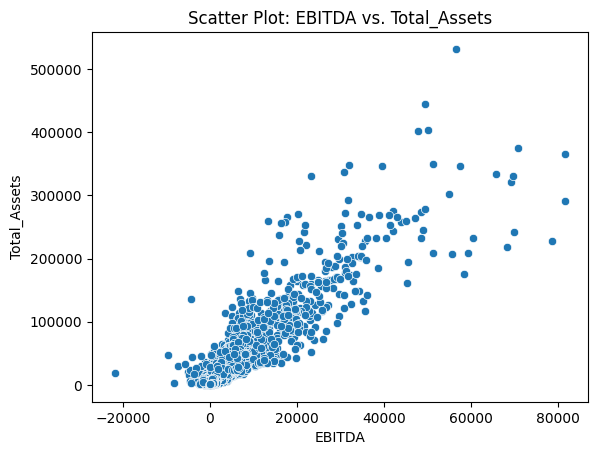

In [25]:
# Create a scatter plot to visualize the relationship between 'EBITDA' and 'Total_Assets'.
sns.scatterplot(data=df, x='EBITDA', y='Total_Assets')

# Add labels to the x and y axes.
plt.xlabel('EBITDA')
plt.ylabel('Total_Assets')

# Set the title for the scatter plot.
plt.title('Scatter Plot: EBITDA vs. Total_Assets')

# Display the plot.
plt.show()


## Inventory

In [26]:
# Generate descriptive statistics for the 'Inventory' column in the DataFrame.
df['Inventory'].describe()

count    78682.000000
mean       201.605717
std       1060.766096
min          0.000000
25%          0.000000
50%          7.023000
75%         74.747250
max      62567.000000
Name: Inventory, dtype: float64

<Axes: xlabel='Inventory'>

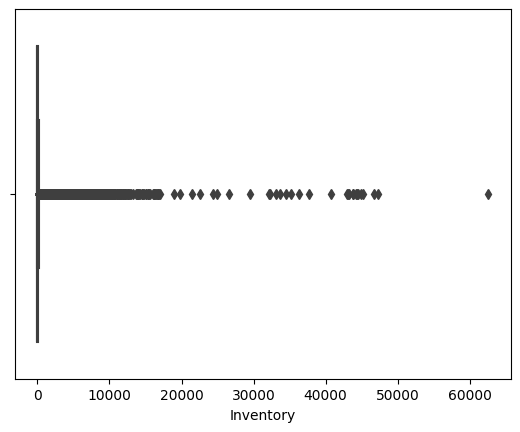

In [27]:
# Create a boxplot to visualize the distribution of 'Inventory' in the DataFrame.
sns.boxplot(x='Inventory', data=df)

## Net_Income

In [28]:
# Generate descriptive statistics for the 'Net_Income' column in the DataFrame.
df['Net_Income'].describe()

count     78682.000000
mean        129.382453
std        1265.532022
min      -98696.000000
25%          -7.415750
50%           1.616000
75%          40.144250
max      104821.000000
Name: Net_Income, dtype: float64

In [29]:
# Select rows in the DataFrame where 'Net_Income' is equal to the minimum 'Net_Income' value.
df[df['Net_Income'] == df['Net_Income'].min()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
35076,C_3532,alive,2002,11155.0,21988.0,3059.0,9057.0,1896.0,-98696.0,5667.0,...,40961.0,115450.0,27354.0,5998.0,18973.0,13395.0,-102362.0,40961.0,57585.0,31904.0


<Axes: xlabel='Net_Income'>

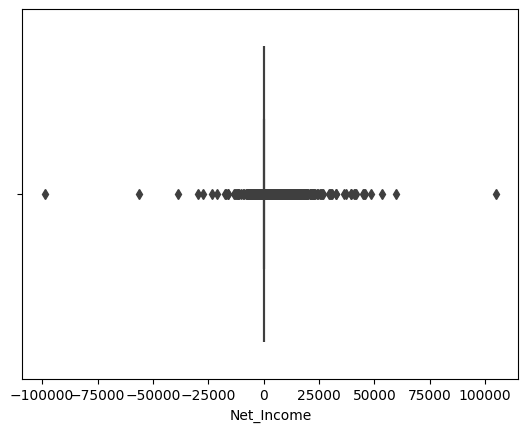

In [30]:
# Create a boxplot to visualize the distribution of 'Net_Income' values in the DataFrame.
sns.boxplot(x='Net_Income', data=df)

## Total_Receivables

In [31]:
# Generate descriptive statistics for the 'Total_Receivables' column in the DataFrame.
df['Total_Receivables'].describe()

count    78682.000000
mean       286.832743
std       1335.978571
min         -0.006000
25%          3.281250
50%         22.820000
75%        131.580500
max      65812.000000
Name: Total_Receivables, dtype: float64

<Axes: xlabel='Total_Receivables'>

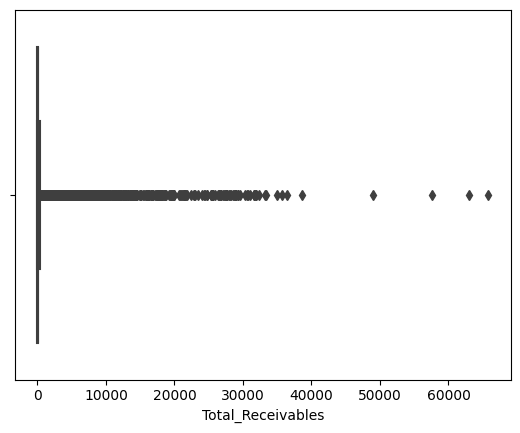

In [32]:
# Create a boxplot to visualize the distribution of 'Total_Receivables' in the DataFrame.
sns.boxplot(x='Total_Receivables', data=df)

## Market_Value

In [33]:
# Generate descriptive statistics for the 'Market_Value' column in the DataFrame.
df['Market_Value'].describe()

count    7.868200e+04
mean     3.414355e+03
std      1.841410e+04
min      1.000000e-04
25%      3.498000e+01
50%      2.275118e+02
75%      1.244890e+03
max      1.073391e+06
Name: Market_Value, dtype: float64

In [34]:
# Select rows in the DataFrame where 'Market_Value' is equal to the maximum 'Market_Value' value.
df[df['Market_Value'] == df['Market_Value'].max()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
1252,C_102,alive,2018,131339.0,152853.0,10903.0,81565.0,3956.0,59531.0,48995.0,...,265359.0,365725.0,93735.0,70662.0,112506.0,116866.0,66946.0,265359.0,258578.0,183794.0


In [35]:
# Select rows in the DataFrame where 'Market_Value' is equal to the minimum 'Market_Value' value.
df[df['Market_Value'] == df['Market_Value'].min()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
7506,C_618,alive,2006,0.028,0.441,0.0,0.141,0.0,-0.086,0.0,...,0.751,0.501,0.0,0.141,0.31,4.593,-23.074,0.751,5.713,0.61


<Axes: xlabel='Market_Value'>

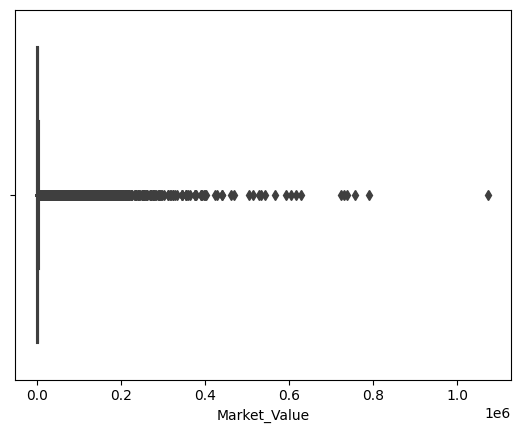

In [36]:
# Create a boxplot to visualize the distribution of 'Market_Value' values in the DataFrame.
sns.boxplot(x='Market_Value', data=df)

## Net_Sales

In [37]:
# Generate descriptive statistics for the 'Net_Sales' column in the DataFrame.
df['Net_Sales'].describe()

count     78682.000000
mean       2364.019706
std       11950.068842
min       -1964.999000
25%          27.548500
50%         186.598500
75%        1046.402500
max      511729.000000
Name: Net_Sales, dtype: float64

In [38]:
# Select rows in the DataFrame where 'Net_Sales' is equal to the minimum 'Net_Sales' value.
df[df['Net_Sales'] == df['Net_Sales'].min()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
27314,C_2425,alive,2014,65.87,0.0,0.0,-1967.817,0.0,-1219.46,12.87,...,-1964.999,1368.022,0.0,-1967.817,-1964.999,1.415,-2609.066,-1964.999,69.471,2.818


In [39]:
# Select rows in the DataFrame where 'Net_Sales' is equal to the maximum 'Net_Sales' value.
df[df['Net_Sales'] == df['Net_Sales'].max()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
20007,C_1682,alive,2018,61897.0,374623.0,10678.0,30149.0,44269.0,6670.0,6283.0,...,511729.0,219295.0,50203.0,19471.0,137106.0,77477.0,69243.0,511729.0,139661.0,481580.0


<Axes: xlabel='Net_Sales'>

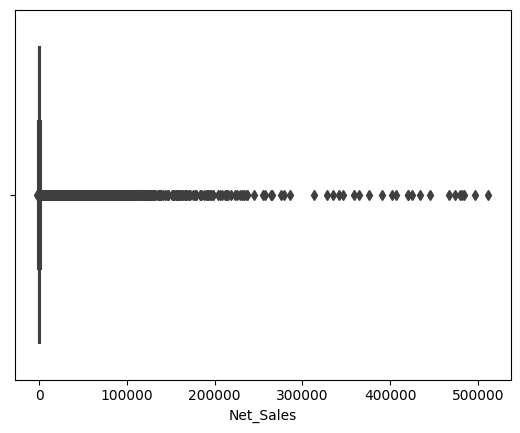

In [40]:
# Create a boxplot to visualize the distribution of 'Net_Sales' values in the DataFrame.
sns.boxplot(x='Net_Sales', data=df)

## Total_Assets

In [41]:
# Generate descriptive statistics for the 'Total_Assets' column in the DataFrame.
df['Total_Assets'].describe()

count     78682.000000
mean       2867.110620
std       12917.944421
min           0.001000
25%          37.363500
50%         213.203500
75%        1171.364750
max      531864.000000
Name: Total_Assets, dtype: float64

<Axes: xlabel='Total_Assets'>

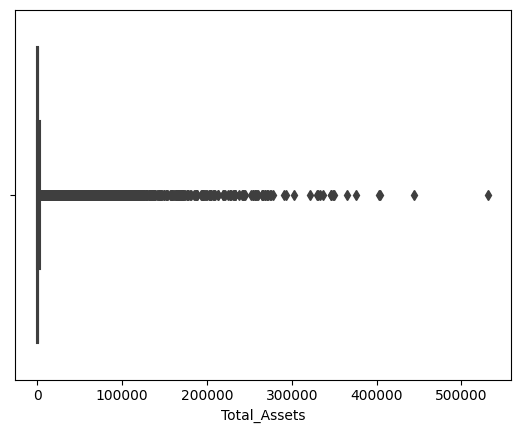

In [42]:
# Create a boxplot to visualize the distribution of 'Total_Assets' values in the DataFrame.
sns.boxplot(x='Total_Assets', data=df)

##  Total_Long_term_Debt

In [43]:
# Generate descriptive statistics for the 'Total_Long-term_Debt' column in the DataFrame.
df['Total_Long_term_Debt'].describe()

count     78682.000000
mean        722.483710
std        3242.170946
min          -0.023000
25%           0.000000
50%           7.593500
75%         248.760750
max      166250.000000
Name: Total_Long_term_Debt, dtype: float64

In [44]:
# Select rows in the DataFrame where 'Total_Long-term_Debt' is equal to the maximum 'Total_Long-term_Debt' value.
df[df['Total_Long_term_Debt'] == df['Total_Long_term_Debt'].max()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,...,Net_Sales,Total_Assets,Total_Long_term_Debt,EBIT,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
17318,C_1452,alive,2018,51427.0,79419.0,28430.0,56574.0,4015.0,19370.0,26472.0,...,170805.0,531864.0,166250.0,28144.0,91386.0,64420.0,63002.0,170805.0,337980.0,114231.0


<Axes: xlabel='Total_Long_term_Debt'>

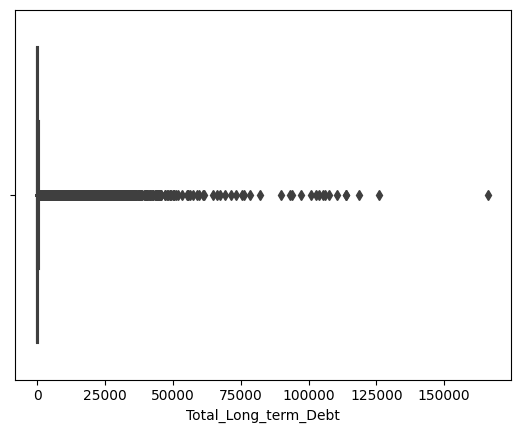

In [45]:
# Create a boxplot to visualize the distribution of 'Total_Long-term_Debt' values in the DataFrame.
sns.boxplot(x='Total_Long_term_Debt', data=df)

## EBIT                         ----->     "Earnings before interest and taxes"

#### The variables  "EBITDA" and  "EBIT" are very strongly correlated with their difference being captured in  "Depreciation and amortization", i.e. "Depreciation and amortization" = "EBITDA" - "EBIT". Thus, "EBIT" can be dropped to decrease multicollinearity.

In [46]:
# Create a DataFrame 'df_corr' containing only the 'EBIT' and 'EBITDA' columns,
# and then calculate the correlation between these two columns.
df_corr = df[['EBIT' , 'EBITDA']]
df_corr.corr()

,EBIT,EBITDA
EBIT,1.000000,0.973745
EBITDA,0.973745,1.000000


In [47]:
# Remove the 'EBIT' column from the DataFrame 'df'.
df.drop("EBIT", axis=1 , inplace=True)

## Gross_Profit

####  "Cost of goods sold" and  "Net sales" are strongly correlated, but not the same factor. However,  "Gross profit" is actually equal net sales subtracted cost of goods sold, "Net sales" - "Cost of goods sold", so this feature can be dropped to decrease multicollinearity

In [48]:
# Generate descriptive statistics for the 'Gross_Profit' column in the DataFrame.
df['Gross_Profit'].describe()

count     78682.000000
mean        769.490783
std        3774.703114
min      -21536.000000
25%           8.521250
50%          63.581500
75%         344.074250
max      137106.000000
Name: Gross_Profit, dtype: float64

In [49]:
# Select rows in the DataFrame where 'Gross_Profit' is equal to the maximum 'Gross_Profit' value.
df[df['Gross_Profit'] == df['Gross_Profit'].max()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,Market_Value,Net_Sales,Total_Assets,Total_Long_term_Debt,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
20007,C_1682,alive,2018,61897.0,374623.0,10678.0,30149.0,44269.0,6670.0,6283.0,275798.74,511729.0,219295.0,50203.0,137106.0,77477.0,69243.0,511729.0,139661.0,481580.0


In [50]:
# Select rows in the DataFrame where 'Gross_Profit' is equal to the minimum 'Gross_Profit' value.
df[df['Gross_Profit'] == df['Gross_Profit'].min()]

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,Market_Value,Net_Sales,Total_Assets,Total_Long_term_Debt,Gross_Profit,Total_Current_Liabilities,Retained_Earnings,Total_Revenue,Total_Liabilities,Total_Operating_Expenses
1187,C_98,alive,2015,3752.0,27919.0,4000.0,-21913.0,570.0,-23119.0,1253.0,16811.172,6383.0,18842.0,8777.0,-21536.0,1841.0,-7269.0,6383.0,14614.0,28296.0


<Axes: xlabel='Gross_Profit'>

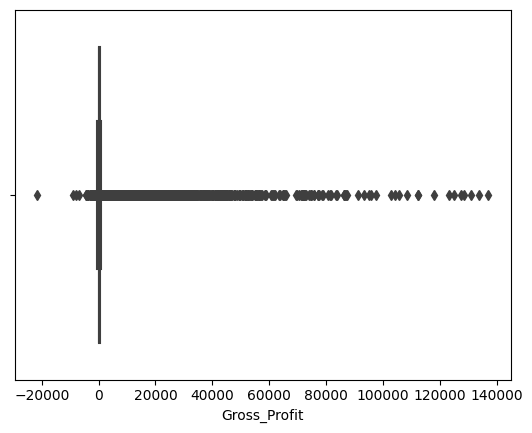

In [51]:
# Create a boxplot to visualize the distribution of 'Gross_Profit' values in the DataFrame.
sns.boxplot(data=df , x='Gross_Profit')

In [52]:
# Remove the 'Gross_Profit' column from the DataFrame 'df'.
df.drop('Gross_Profit' , axis=1 , inplace=True)

# Total_Current_Liabilities

In [53]:
# Generate descriptive statistics for the 'Total_Current_Liabilities' column in the DataFrame.
df['Total_Current_Liabilities'].describe()

count     78682.000000
mean        610.072255
std        2938.387443
min           0.001000
25%           8.889250
50%          43.333000
75%         222.817000
max      116866.000000
Name: Total_Current_Liabilities, dtype: float64

<Axes: xlabel='Total_Current_Liabilities'>

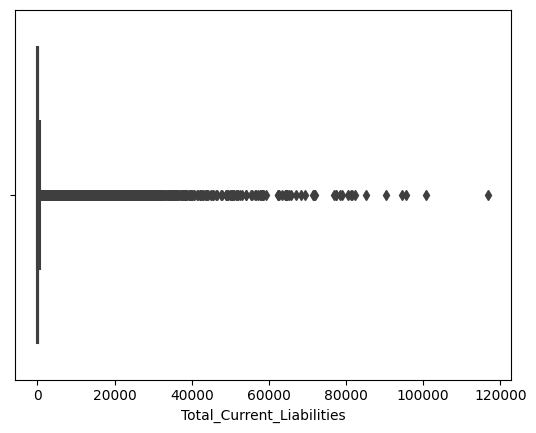

In [54]:
# Create a boxplot to visualize the distribution of 'Total_Current_Liabilities' values in the DataFrame.
sns.boxplot(data=df , x='Total_Current_Liabilities')

# Retained_Earnings

In [55]:
# Generate descriptive statistics for the 'Retained_Earnings' column in the DataFrame.
df['Retained_Earnings'].describe()

count     78682.000000
mean        532.467069
std        6369.159440
min     -102362.000000
25%         -68.282750
50%          -1.131000
75%         146.070000
max      402089.000000
Name: Retained_Earnings, dtype: float64

<Axes: xlabel='Retained_Earnings'>

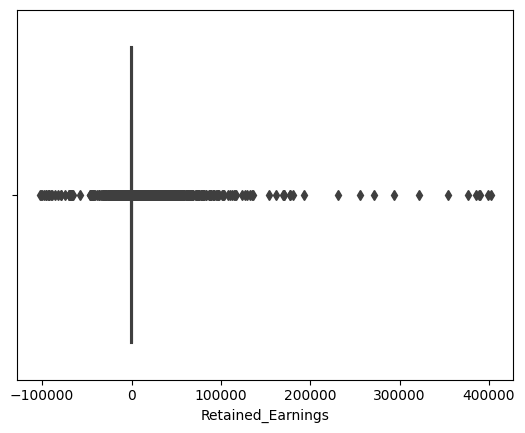

In [56]:
# Create a boxplot to visualize the distribution of 'Retained_Earnings' values in the DataFrame.
sns.boxplot(data=df , x='Retained_Earnings')

# Total_Revenue

#### "Net sales" and "Total revenue" are identical and therefore perfectly correlated. Dropping one to decrease multicollinearity.

In [57]:
# Calculate the maximum difference between 'Net_Sales' and 'Total_Revenue' in the DataFrame.
(df["Net_Sales"]-df["Total_Revenue"]).max()

0.0

In [58]:
# Remove the 'Total_Revenue' column from the DataFrame 'df'.
df.drop('Total_Revenue' , axis=1 , inplace=True)

# Total_Liabilities

In [59]:
# Generate descriptive statistics for the 'Total_Liabilities' column in the DataFrame.
df['Total_Liabilities'].describe()

count     78682.000000
mean       1773.563963
std        8053.684902
min           0.001000
25%          13.486000
50%          81.988000
75%         629.975000
max      337980.000000
Name: Total_Liabilities, dtype: float64

<Axes: xlabel='Total_Liabilities'>

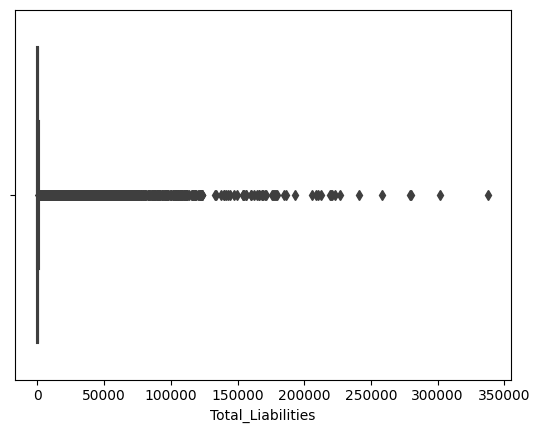

In [60]:
# Create a boxplot to visualize the distribution of 'Total_Liabilities' values in the DataFrame.
sns.boxplot(data=df , x='Total_Liabilities')

# Total_Operating_Expenses

In [61]:
# Generate descriptive statistics for the 'Total_Operating_Expenses' column in the DataFrame.

df['Total_Operating_Expenses'].describe()

count     78682.000000
mean       1987.260307
std       10419.629038
min        -317.197000
25%          32.872500
50%         168.912000
75%         875.522250
max      481580.000000
Name: Total_Operating_Expenses, dtype: float64

<Axes: xlabel='Total_Operating_Expenses'>

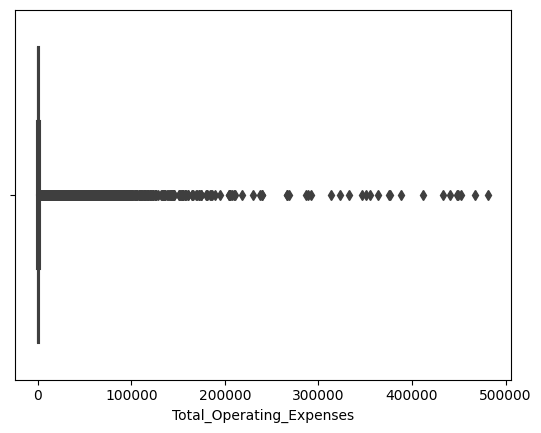

In [62]:
# Create a boxplot to visualize the distribution of 'Total_Operating_Expenses' values in the DataFrame.
sns.boxplot(data=df , x='Total_Operating_Expenses')

In [63]:
df

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,Market_Value,Net_Sales,Total_Assets,Total_Long_term_Debt,Total_Current_Liabilities,Retained_Earnings,Total_Liabilities,Total_Operating_Expenses
0,C_1,alive,1999,511.267,833.107,18.373,89.031,336.018,35.163,128.348,372.7519,1024.333,740.998,180.447,163.816,201.026,401.483,935.302
1,C_1,alive,2000,485.856,713.811,18.577,64.367,320.590,18.531,115.187,377.1180,874.255,701.854,179.987,125.392,204.065,361.642,809.888
2,C_1,alive,2001,436.656,526.477,22.496,27.207,286.588,-58.939,77.528,364.5928,638.721,710.199,217.699,150.464,139.603,399.964,611.514
3,C_1,alive,2002,396.412,496.747,27.172,30.745,259.954,-12.410,66.322,143.3295,606.337,686.621,164.658,203.575,124.106,391.633,575.592
4,C_1,alive,2003,432.204,523.302,26.680,47.491,247.245,3.504,104.661,308.9071,651.958,709.292,248.666,131.261,131.884,407.608,604.467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78677,C_8971,alive,2014,233.211,43.338,14.094,45.615,3.376,25.261,22.846,756.4827,104.223,1099.101,184.666,28.197,28.095,225.887,58.608
78678,C_8971,alive,2015,105.559,59.184,42.592,202.133,2.288,129.688,54.611,527.5750,291.153,1865.926,770.103,88.128,157.783,880.327,89.020
78679,C_8971,alive,2016,63.971,69.074,65.057,79.051,2.581,-1.442,42.467,578.8868,169.858,1746.235,683.985,85.765,156.341,770.233,90.807
78680,C_8971,alive,2017,135.207,66.527,65.330,69.171,2.013,-20.401,27.217,412.6241,161.884,1736.110,694.035,82.010,135.941,776.697,92.713


In [64]:


# Assuming you have your DataFrame named 'df'

# Define the list of columns you want to include in the heatmap
variables = ['Current_Assets', 'Cost_of_Goods_Sold', 'Depreciation_and_Amortization', 'EBITDA', 'Inventory',
             'Net_Income', 'Total_Receivables', 'Market_Value', 'Net_Sales', 'Total_Assets', 'Total_Long_term_Debt',
              'Total_Current_Liabilities', 'Retained_Earnings', 
             'Total_Liabilities', 'Total_Operating_Expenses']

# Create a new DataFrame containing only the selected columns
selected_df = df[variables]

# Create a correlation matrix
correlation_matrix = selected_df.corr()

# Create a heatmap using Plotly
fig = px.imshow(correlation_matrix, x=variables, y=variables,width=800,height=800,text_auto=True)
fig.update_layout(
    title="Correlation Heatmap",
    xaxis_title="Variables",
    yaxis_title="Variables",
    
)
fig.show()

# Questions


### Question 1: What are the current assets of the company with the highest current assets?

In [65]:
# Select the company or companies with 'Current_Assets' equal to the maximum 'Current_Assets' value in the DataFrame.
company_with_max_current_assets = df[df['Current_Assets'] == df['Current_Assets'].max()]
company_with_max_current_assets

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA,Inventory,Net_Income,Total_Receivables,Market_Value,Net_Sales,Total_Assets,Total_Long_term_Debt,Total_Current_Liabilities,Retained_Earnings,Total_Liabilities,Total_Operating_Expenses
21577,C_1825,alive,2018,169662.0,28453.0,9900.0,44958.0,2662.0,16571.0,26481.0,757028.97,110360.0,258848.0,81935.0,58488.0,11495.0,176130.0,65402.0


### Question 2: What is the total cost of goods sold for all companies?

In [66]:
# Calculate the total cost of goods sold by summing the 'Cost_of_Goods_Sold' column in the DataFrame.
total_cost_of_goods_sold = df['Cost_of_Goods_Sold'].sum()
print(F"Total cost of goods sold is :{total_cost_of_goods_sold}")

Total cost of goods sold is :125460733.05


## Question 3: What is the main factor causing corporate bankruptcy?

### 1- High Debt Levels (Total Long-term debt and Total Liabilities): Excessive long-term debt and high liabilities can lead to financial distress if a company is unable to meet its debt obligations.

### 2- Low Profitability (Net Income): Consistently low or negative net income may indicate financial troubles and an inability to cover expenses.

### 3- Lack of Liquidity (Total Receivables, Inventory, and Total Current Liabilities): A poor balance between accounts receivable, inventory, and current liabilities can result in cash flow problems and difficulty in meeting short-term obligations.

### 4- Inefficient Operations (Cost of Goods Sold, Net Sales, and Total Operating Expenses): High costs of goods sold and operating expenses relative to net sales can lead to poor profitability and financial instability.

### 5- Asset Mismanagement (Current Assets and Total assets): Inefficient management of assets can tie up capital and limit a company's ability to invest in growth opportunities.

### 6- Market Factors (Market value): A declining market value may indicate a lack of investor confidence, making it more difficult to raise capital or refinance debt.

In [67]:
# Create a new DataFrame 'df_failed' with rows where 'status_label' is equal to 'failed'.
df_failed = df[df['status_label']=='failed']

In [68]:
# This function is designed to address the issue of wide data with 43 columns, where it becomes difficult
# to view all the values properly. By creating this function, we aim to display all values of all columns,
# making the data analysis process more convenient and accessible.

def show_df(x):
    
    """
    Display specific columns from the DataFrame 'df' to showcase a subset of data.

    Args:
        df (pandas.DataFrame): The input DataFrame.

    Returns:
        None
    """
    
    # Create separate DataFrames with selected columns for display
    df1 = x[['company_name', 'status_label', 'year', 'Current_Assets',
       'Cost_of_Goods_Sold', 'Depreciation_and_Amortization', 'EBITDA']].head(5)
    df2 = x[['Inventory', 'Net_Income', 'Total_Receivables', 'Market_Value',
       'Net_Sales', 'Total_Assets', 'Total_Long_term_Debt']].head(5)
    df3 = x[[ 'Total_Current_Liabilities', 'Retained_Earnings', 
             'Total_Liabilities', 'Total_Operating_Expenses']].head(5)
   
    
    
    # Display the separate DataFrames
    display(df1)
    display(df2)
    display(df3)
    
    
    
# Show DataFrame 'df'
show_df(df_failed)

,company_name,status_label,year,Current_Assets,Cost_of_Goods_Sold,Depreciation_and_Amortization,EBITDA
50,C_6,failed,1999,4424.0,15482.0,1092.0,2248.0
51,C_6,failed,2000,5179.0,17120.0,1202.0,2583.0
52,C_6,failed,2001,6540.0,19419.0,1404.0,-456.0
53,C_6,failed,2002,4937.0,18555.0,1366.0,-1256.0
54,C_6,failed,2003,4682.0,14430.0,1377.0,582.0


,Inventory,Net_Income,Total_Receivables,Market_Value,Net_Sales,Total_Assets,Total_Long_term_Debt
50,708.0,985.0,1134.0,9932.4150,17730.0,24374.0,5689.0
51,757.0,813.0,1303.0,5958.9688,19703.0,26213.0,5474.0
52,822.0,-1762.0,1414.0,3445.0155,18963.0,32841.0,9834.0
53,627.0,-3511.0,1481.0,1030.1874,17299.0,30267.0,12310.0
54,516.0,-1228.0,796.0,2066.5869,17440.0,29330.0,13126.0


,Total_Current_Liabilities,Retained_Earnings,Total_Liabilities,Total_Operating_Expenses
50,5864.0,5716.0,17516.0,15482.0
51,6990.0,5948.0,19037.0,17120.0
52,7512.0,4042.0,27468.0,19419.0
53,7240.0,-399.0,29310.0,18555.0
54,6559.0,-1336.0,29284.0,16858.0


## Question 4: Calculate the average EBITDA .

In [69]:
# Calculate the average EBITDA by computing the mean of the 'EBITDA' column in the DataFrame.
average_ebitda = df['EBITDA'].mean().round(2)
# Display the Average EBITDA with a formatted message.
print(F"Average EBITDA is :{average_ebitda}")

Average EBITDA is :376.76


## Question 5: Calculate the total operating expenses for all companies.

In [70]:
# Calculate the total operating expenses by summing the values in the 'Total_Operating_Expenses' column of the DataFrame.
total_operating_expenses = df['Total_Operating_Expenses'].sum()
# Display the total operating expenses with a formatted message.
print(F"Total operating expenses is :{total_operating_expenses}")

Total operating expenses is :156361615.48


## Question 6: Calculate the total liabilities for all bankrupt companies.

In [71]:
# Calculate the total liabilities for companies with a 'failed' status by summing the 'Total_Liabilities' column
# in the 'df_failed' DataFrame and round the result to two decimal places.
total_liabilities = df_failed['Total_Liabilities'].sum().round(2)

# Display the total liabilities with a formatted message.
print(F"Total liabilities is :{total_liabilities}")



Total liabilities is :6612783.43


## Question 7: What is the total of all assets for bankrupt companies?

In [72]:
# Calculate the total assets by summing the 'Total_Assets' column and rounding the result to two decimal places.
total_assets = df['Total_Assets'].sum().round(2)

# Display the total assets with a formatted message.
print(f"Total assets is: {total_assets}")



Total assets is: 225589997.84


## Question 8: Calculate the total retained earnings for all companies.

In [73]:
# Calculate the total retained earnings by summing the 'Retained_Earnings' column and rounding the result to two decimal places.
total_retained_earnings = df['Retained_Earnings'].sum().round(2)

# Display the total retained earnings with a formatted message.
print(f'Total retained earnings is: {total_retained_earnings}')


Total retained earnings is: 41895573.91


## Question 9: What is the total depreciation and amortization for all years?

In [74]:
# Calculate the total depreciation and amortization by summing the 'Depreciation_and_Amortization' column and rounding the result to two decimal places.
total_depreciation_amortization = df['Depreciation_and_Amortization'].sum().round(2)

# Display the total depreciation and amortization with a formatted message.
print(f'Total depreciation and amortization is: {total_depreciation_amortization}')


Total depreciation and amortization is: 9538953.76


## Question 10: What are the total operating expenses for each year?

In [75]:
total_operating_expenses = df['Total_Operating_Expenses'].sum()
print(f"Total operating expenses is : {total_operating_expenses}")

Total operating expenses is : 156361615.48


In [76]:
# Calculate the total operating expenses by summing the 'Total_Operating_Expenses' column.
total_operating_expenses = df['Total_Operating_Expenses'].sum()

# Display the total operating expenses with a formatted message.
print(f"Total operating expenses is: {total_operating_expenses}")


Total operating expenses is: 156361615.48


# Model Prepare 

In [77]:
# Map the 'status_label' values to numerical values (1 for 'alive', 0 for 'failed').
df['status_label']=df['status_label'].map({'alive' : 1,'failed':0})

In [78]:
# Remove the 'company_name' and 'year' columns from the DataFrame.
df.drop(['company_name', 'year'], axis=1, inplace=True)


In [79]:
# Count the number of duplicated rows in the DataFrame.
df.duplicated().sum()


0

In [80]:
# Separate the DataFrame into features (x) and the target variable (y).
x = df.drop('status_label', axis=1)  # x contains features (all columns except 'status_label').
y = df['status_label']  # y contains the target variable 'status_label'.


In [81]:
# Import the required libraries for building a machine learning pipeline.
from sklearn.pipeline import Pipeline  # To create a data processing and modeling pipeline.
from sklearn.model_selection import cross_validate  # To perform cross-validation for model evaluation.
from sklearn.preprocessing import StandardScaler  # To standardize (scale) features.


In [82]:
# Import machine learning models for classification tasks.
from sklearn.linear_model import LogisticRegression  # Logistic Regression model.
from sklearn.tree import DecisionTreeClassifier  # Decision Tree Classifier model.
from xgboost import XGBClassifier  # XGBoost Classifier model.


In [83]:
# Initialize a list of machine learning models for classification.
models = []

# Add models to the list along with their abbreviated names and corresponding model objects.
models.append(("LR", LogisticRegression()))  # Logistic Regression
models.append(("CART", DecisionTreeClassifier()))  # Decision Tree Classifier
models.append(("XG", XGBClassifier()))  # XGBoost Classifier


In [84]:
# Iterate through the list of machine learning models.
for model in models:
    steps = list()
    
    # Add data preprocessing step (StandardScaler) and the current model to the pipeline.
    steps.append(("Scaler", StandardScaler()))
    steps.append(model)
    
    # Create a pipeline with the preprocessing steps and the model.
    pipeline = Pipeline(steps=steps)
    
    # Perform cross-validation and evaluate the model's performance.
    scores = cross_validate(pipeline, x, y, cv=5, scoring="accuracy", return_train_score=True)
    
    # Display model-specific evaluation metrics.
    print(model[0])  # Print the model's abbreviation.
    print("Train_accuracy", scores["train_score"].mean())  # Display mean training accuracy.
    print("-" * 10)
    print("Test_accuracy", scores["test_score"].mean())  # Display mean testing accuracy.
    print("-" * 20)
    print("\n")


LR
Train_accuracy 0.9337014820316728
----------
Test_accuracy 0.9330977854753396
--------------------


CART
Train_accuracy 1.0
----------
Test_accuracy 0.8782564810315104
--------------------


XG
Train_accuracy 0.9556283471513473
----------
Test_accuracy 0.9284969519470707
--------------------




In [85]:
# Create a machine learning pipeline with data preprocessing (StandardScaler) and a Decision Tree Classifier model.
steps = []  # Initialize a list to store the steps in the pipeline.

# Add data preprocessing step: Scaling features using StandardScaler.
steps.append(("Scaler", StandardScaler()))

# Add the machine learning model: Decision Tree Classifier.
steps.append(('Model', XGBClassifier()))

# Create the pipeline by specifying the steps.
pipeline = Pipeline(steps=steps)


In [86]:
pipeline

Pipeline(steps=[('Scaler', StandardScaler()),
                ('Model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [87]:
from sklearn.model_selection import GridSearchCV , cross_validate

In [89]:
params = [
    
    {   'Model__max_depth': [3, 4, 5, 6], 'Model__n_estimators': [70, 80, 90]}
]

In [90]:
grid = GridSearchCV(estimator = pipeline , param_grid = params , cv = 5  ,return_train_score=True ,  scoring = "accuracy" )

In [91]:
grid.fit(x,y)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('Scaler', StandardScaler()),
                                       ('Model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      device=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None,
                                                      grow_policy=None,
                                                      importance_type=...
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=None, ...))]),
             param_grid=[{'Model__max_depth': [3, 4, 5, 6],
                          'Model__n_estimators': [70, 80, 90]}],
             return_train_score=True, scoring='accuracy')

In [92]:
grid.best_params_

{'Model__max_depth': 3, 'Model__n_estimators': 70}

In [93]:
grid.cv_results_["mean_train_score"].max()

0.9534328027112103

In [94]:
grid.cv_results_["mean_test_score"].max()

0.9323097979791684

In [96]:
steps = list()
steps.append(("Scaler" , StandardScaler() ))
steps.append(('Model', XGBClassifier(max_depth =  3, n_estimators = 70)))
pipeline = Pipeline(steps = steps)

In [97]:
# Fit the machine learning pipeline to the training data.
pipeline.fit(x, y)

Pipeline(steps=[('Scaler', StandardScaler()),
                ('Model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=70, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [98]:
# Save the trained machine learning pipeline to a file named 'model.pkl'.
joblib.dump(pipeline, 'model.pkl')
# Save the feature column names to a file named 'inputs.pkl'.
joblib.dump(x.columns, 'inputs.pkl')

['inputs.pkl']

In [99]:
%%writefile app.py
# Import necessary libraries.
import streamlit as st
import pandas as pd
import joblib

# Load the trained model and feature names
model = joblib.load("model.pkl")
inputs = joblib.load("inputs.pkl")

# Define a function for making predictions
def prediction(Current_Assets, Cost_of_Goods_Sold, Depreciation_and_Amortization,
       EBITDA, Inventory, Net_Income, Total_Receivables,
       Market_Value, Net_Sales, Total_Assets, Total_Long_term_Debt,
       Total_Current_Liabilities, Retained_Earnings, Total_Liabilities,
       Total_Operating_Expenses):
    # Create a DataFrame with columns based on feature names.
    df = pd.DataFrame(columns=inputs)
    # Set the provided input values in the DataFrame.
    df.at[0, 'Current_Assets'] = Current_Assets
    df.at[0, 'Cost_of_Goods_Sold'] = Cost_of_Goods_Sold
    df.at[0, 'Depreciation_and_Amortization'] = Depreciation_and_Amortization
    df.at[0, 'EBITDA'] = EBITDA
    df.at[0, 'Inventory'] = Inventory
    df.at[0, 'Net_Income'] = Net_Income
    df.at[0, 'Total_Receivables'] = Total_Receivables
    df.at[0, 'Market_Value'] = Market_Value
    df.at[0, 'Net_Sales'] = Net_Sales
    df.at[0, 'Total_Assets'] = Total_Assets
    df.at[0, 'Total_Long_term_Debt'] = Total_Long_term_Debt
    df.at[0, 'Total_Current_Liabilities'] = Total_Current_Liabilities
    df.at[0, 'Retained_Earnings'] = Retained_Earnings
    df.at[0, 'Total_Liabilities'] = Total_Liabilities
    df.at[0, 'Total_Operating_Expenses'] = Total_Operating_Expenses
    # Use the model to make predictions.
    res = model.predict(df)
    return res[0]

# Define the main function for the Streamlit app.
def main():
    # Create a Streamlit web interface.
    st.title("Bankruptcy Prediction")
    
    # Create input fields for user input
    features = [
        "Current Assets", "Cost of Goods Sold", "Depreciation and Amortization",
        "EBITDA", "Inventory", "Net Income", "Total Receivables",
        "Market Value", "Net Sales", "Total Assets", "Total Long-term Debt",
        "Total Current Liabilities", "Retained Earnings", "Total Liabilities",
        "Total Operating Expenses"
    ]

    input_values = [st.text_input(feature) for feature in features]

    if st.button("Predict"):
        # Call the prediction function and display the result
        result = prediction(*input_values)
        st.write(f"Prediction for this company is: {'Not Bankrupt' if result == 1 else 'Bankrupt'}")

main()


Overwriting app.py
